In [2]:
import os
import time
import pickle
import pydicom
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pydicom.pixel_data_handlers.util import apply_voi_lut

In [4]:
df_dicom = pd.read_pickle('/home/single3/Documents/tintrung/brainmri/tinnvt/summary_dicom.pkl')
pd.set_option("display.max_colwidth", None)
df_dicom.head()

,StudyInstanceUID,SeriesInstanceUID,SeriesDescription,Rows,Columns,SliceThickness,PixelSpacing,SpacingBetweenSlices,SliceLocation,SmallestImagePixelValue,LargestImagePixelValue,WindowCenter,WindowWidth,ImagePositionPatient,ImageOrientationPatient,RepetitionTime,EchoTime,PatientPosition,DicomFileName
0,1.2.840.113619.6.388.101774739834280643528361334251926593124,1.2.840.113619.2.5.1916222523715996118091599611809219000,Apparent Diffusion Coefficient (mm2/s),256,256,5,"[1.0156, 1.0156]",6,12.219,269,5118,1300,2400,"[-129.19, -128.506, 19.0657]","[0.999995, 0.00266694, 0.0014183, -0.00258601, 0.998522, -0.0542916]",4384,101.9,HFS,1.2.840.113619.2.311.118469111826723530957815646435435346224.dcm
1,1.2.840.113619.6.388.101774739834280643528361334251926593124,1.2.840.113619.2.5.1916222523715996118091599611809219000,Apparent Diffusion Coefficient (mm2/s),256,256,5,"[1.0156, 1.0156]",6,-53.6836,48,5624,1300,2400,"[-129.086, -132.089, -46.8369]","[0.999995, 0.00266694, 0.0014183, -0.00258601, 0.998522, -0.0542916]",4384,101.9,HFS,1.2.840.113619.2.311.125282295065266504184867863002451722448.dcm
2,1.2.840.113619.6.388.101774739834280643528361334251926593124,1.2.840.113619.2.5.1916222523715996118091599611809219000,Apparent Diffusion Coefficient (mm2/s),256,256,5,"[1.0156, 1.0156]",6,30.1924,346,4091,1300,2400,"[-129.218, -127.529, 37.0391]","[0.999995, 0.00266694, 0.0014183, -0.00258601, 0.998522, -0.0542916]",4384,101.9,HFS,1.2.840.113619.2.311.13734497280751956864742956698508702383.dcm
3,1.2.840.113619.6.388.101774739834280643528361334251926593124,1.2.840.113619.2.5.1916222523715996118091599611809219000,Apparent Diffusion Coefficient (mm2/s),256,256,5,"[1.0156, 1.0156]",6,-29.719,205,4953,1300,2400,"[-129.124, -130.786, -22.8723]","[0.999995, 0.00266694, 0.0014183, -0.00258601, 0.998522, -0.0542916]",4384,101.9,HFS,1.2.840.113619.2.311.149759259314721767500053971461046076203.dcm
4,1.2.840.113619.6.388.101774739834280643528361334251926593124,1.2.840.113619.2.5.1916222523715996118091599611809219000,Apparent Diffusion Coefficient (mm2/s),256,256,5,"[1.0156, 1.0156]",6,0.23671,250,5017,1300,2400,"[-129.171, -129.158, 7.08339]","[0.999995, 0.00266694, 0.00141831, -0.00258601, 0.998522, -0.0542916]",4384,101.9,HFS,1.2.840.113619.2.311.162064945887768070496287289213718815545.dcm


In [5]:
df_xml = pd.read_pickle('/home/single3/Documents/tintrung/brainmri/tinnvt/summary_xml.pkl')
pd.set_option("display.max_colwidth", None)
df_xml.head()

,xml_name,patientPid,diagnosis,sessionId,type,annotation,scope,pointUnit,createTimestamp,imageUid,seriesUid,studyUid,tags,point
0,1.2.840.113619.6.388.101774739834280643528361334251926593124,YC21,"[908910, 908912]",BSDIEP,local,20,,mm,1610884981375,,1.2.840.113619.2.388.57473.14165493.12654.1599525247.526,1.2.840.113619.6.388.101774739834280643528361334251926593124,Mass/Nodule,"[[-12.035799980164, -70.509002685547, -40.168701171875], [4.9613599777222, -70.509002685547, -40.168701171875], [4.9613599777222, -52.882301330566, -40.168701171875], [-12.035799980164, -52.882301330566, -40.168701171875], [-36.587299346924, -83.728996276855, -18.568700790405], [7.4794502258301, -83.728996276855, -18.568700790405], [7.4794502258301, -47.216598510742, -18.568700790405], [-36.587299346924, -47.216598510742, -18.568700790405], [-25.885299682617, -81.210899353027, -4.1686601638794], [-0.074838802218437, -81.210899353027, -4.1686601638794], [-0.074838802218437, -58.548000335693, -4.1686601638794], [-25.885299682617, -58.548000335693, -4.1686601638794]]"
1,1.2.840.113619.6.388.101774739834280643528361334251926593124,YC21,"[908910, 908912]",BSDIEP,local,20,,mm,1610885017001,,1.2.840.113619.2.388.57473.14165493.12654.1599525247.526,1.2.840.113619.6.388.101774739834280643528361334251926593124,Cerebral edema,"[[-46.030101776123, -54.770900726318, -36.568698883057], [16.29280090332, -54.770900726318, -36.568698883057], [16.29280090332, -16.999399185181, -36.568698883057], [-46.030101776123, -16.999399185181, -36.568698883057], [-51.066299438477, -84.988098144531, -18.568700790405], [23.847099304199, -84.988098144531, -18.568700790405], [23.847099304199, 12.588199615479, -18.568700790405], [-51.066299438477, 12.588199615479, -18.568700790405], [-20.849100112915, -47.846099853516, 39.031299591064], [-2.5929400920868, -47.846099853516, 39.031299591064], [-2.5929400920868, -10.07470035553, 39.031299591064], [-20.849100112915, -10.07470035553, 39.031299591064]]"
2,1.2.840.113619.6.388.101774739834280643528361334251926593124,YC21,"[908910, 908912]",BSDIEP,local,20,,mm,1610885075681,,1.2.840.113619.2.388.57473.14165493.12654.1599525247.526,1.2.840.113619.6.388.101774739834280643528361334251926593124,Midline shift,"[[-0.074838802218437, -44.698501586914, -18.568700790405], [22.587999343872, -44.698501586914, -18.568700790405], [22.587999343872, 27.067300796509, -18.568700790405], [-0.074838802218437, 27.067300796509, -18.568700790405], [-0.074838802218437, -44.698501586914, -2.3686599731445], [35.17850112915, -44.698501586914, -2.3686599731445], [35.17850112915, 23.919700622559, -2.3686599731445], [-0.074838802218437, 23.919700622559, -2.3686599731445], [-0.074838802218437, -44.698501586914, 17.431299209595], [17.55179977417, -44.698501586914, 17.431299209595], [17.55179977417, 5.0339298248291, 17.431299209595], [-0.074838802218437, 5.0339298248291, 17.431299209595]]"
3,1.2.840.113619.6.388.101774739834280643528361334251926593124,YC21,"[908910, 908912]",BSDIEP,global,-1,series,,1610885136683,,1.2.840.113619.2.388.57473.14165493.12654.1599525247.529,1.2.840.113619.6.388.101774739834280643528361334251926593124,Meningioma,[None]
4,1.2.840.113619.6.388.106738880751051415278716030635969460033,23 BHK,"[841808, 841810]",BSDIEP,local,20,,mm,1607483610460,,1.2.840.113619.2.388.57473.14165493.13177.1591830725.678,1.2.840.113619.6.388.106738880751051415278716030635969460033,Mass/Nodule,"[[-1.3457000255585, -22.289400100708, -15.313799858093], [18.267099380493, -22.289400100708, -15.313799858093], [18.267099380493, -9.8679399490356, -15.313799858093], [-1.3457000255585, -9.8679399490356, -15.313799858093], [-1.3457000255585, -28.1732006073, -4.5137701034546], [20.228399276733, -28.1732006073, -4.5137701034546], [20.228399276733, -7.2528901100159, -4.5137701034546], [-1.3457000255585, -7.2528901100159, -4.5137701034546], [6.4994301795959, -23.596900939941, 9.88623046875], [18.267099380493, -23.596900939941, 9.88623046875], [18.267099380493, -9.8679399490356, 9.8862304

In [6]:
list_seriesUid_xml = []
for key,value in enumerate(df_xml['seriesUid']):
    list_seriesUid_xml.append(value)
set_seriesUid_xml = set(list_seriesUid_xml)
len(set_seriesUid_xml)

161

In [5]:
# Choice random index of list seriesUID xml, then map with dicom files have same seriesUID, sort values by "Slice Location"
# index = 113
# choisen_seriesUID = list(set_seriesUid_xml)[index]
choisen_seriesUID = '1.2.840.113619.2.410.15512023.5814788.18527.1569544481.358'
df_one_seriesUID = df_dicom[df_dicom['SeriesInstanceUID']==choisen_seriesUID].sort_values(by='SliceLocation')
df_one_seriesUID = df_one_seriesUID.reset_index()
df_one_seriesUID

,index,StudyInstanceUID,SeriesInstanceUID,SeriesDescription,Rows,Columns,SliceThickness,PixelSpacing,SpacingBetweenSlices,SliceLocation,SmallestImagePixelValue,LargestImagePixelValue,WindowCenter,WindowWidth,ImagePositionPatient,ImageOrientationPatient,RepetitionTime,EchoTime,PatientPosition,NameFileDCM
0,24755,1.2.840.113619.6.410.211312410577086490523754881444784253502,1.2.840.113619.2.410.15512023.5814788.18527.1569544481.358,Ax T2 FLAIR,512,512,5.0,"[0.4492, 0.4492]",6.0,-92.007233,0,3138,1569.0,3138.0,"[-115.972, -88.3281, -92.4973]","[0.998874, -0.0269739, -0.0390224, 0.0286591, 0.998651, 0.0432926]",10000.0,140.96,HFS,1.2.840.113619.2.410.15512023.5814788.14566.1569544593.902.dcm
1,24779,1.2.840.113619.6.410.211312410577086490523754881444784253502,1.2.840.113619.2.410.15512023.5814788.18527.1569544481.358,Ax T2 FLAIR,512,512,5.0,"[0.4492, 0.4492]",6.0,-86.017426,0,3135,1567.0,3135.0,"[-115.745, -88.5943, -86.5075]","[0.998874, -0.0269739, -0.0390224, 0.0286591, 0.998651, 0.0432926]",10000.0,140.96,HFS,1.2.840.113619.2.410.15512023.5814788.14566.1569544593.915.dcm
2,24756,1.2.840.113619.6.410.211312410577086490523754881444784253502,1.2.840.113619.2.410.15512023.5814788.18527.1569544481.358,Ax T2 FLAIR,512,512,5.0,"[0.4492, 0.4492]",6.0,-80.027618,0,2389,1194.0,2389.0,"[-115.518, -88.8604, -80.5177]","[0.998874, -0.0269739, -0.0390224, 0.0286591, 0.998651, 0.0432926]",10000.0,140.96,HFS,1.2.840.113619.2.410.15512023.5814788.14566.1569544593.903.dcm
3,24767,1.2.840.113619.6.410.211312410577086490523754881444784253502,1.2.840.113619.2.410.15512023.5814788.18527.1569544481.358,Ax T2 FLAIR,512,512,5.0,"[0.4492, 0.4492]",6.0,-74.037811,0,2363,1181.0,2363.0,"[-115.292, -89.1266, -74.5279]","[0.998874, -0.0269738, -0.0390224, 0.0286591, 0.998651, 0.0432926]",10000.0,140.96,HFS,1.2.840.113619.2.410.15512023.5814788.14566.1569544593.916.dcm
4,24757,1.2.840.113619.6.410.211312410577086490523754881444784253502,1.2.840.113619.2.410.15512023.5814788.18527.1569544481.358,Ax T2 FLAIR,512,512,5.0,"[0.4492, 0.4492]",6.0,-68.048004,0,3032,1516.0,3032.0,"[-115.065, -89.3928, -68.5381]","[0.998874, -0.0269739, -0.0390224, 0.0286591, 0.998651, 0.0432926]",10000.0,140.96,HFS,1.2.840.113619.2.410.15512023.5814788.14566.1569544593.904.dcm
5,24768,1.2.840.113619.6.410.211312410577086490523754881444784253502,1.2.840.113619.2.410.15512023.5814788.18527.1569544481.358,Ax T2 FLAIR,512,512,5.0,"[0.4492, 0.4492]",6.0,-62.058197,0,3028,1514.0,3028.0,"[-114.838, -89.659, -62.5483]","[0.998874, -0.0269739, -0.0390224, 0.0286591, 0.998651, 0.0432926]",10000.0,140.96,HFS,1.2.840.113619.2.410.15512023.5814788.14566.1569544593.917.dcm
6,24778,1.2.840.113619.6.410.211312410577086490523754881444784253502,1.2.840.113619.2.410.15512023.5814788.18527.1569544481.358,Ax T2 FLAIR,512,512,5.0,"[0.4492, 0.4492]",6.0,-56.06839,0,3068,1534.0,3068.0,"[-114.611, -89.9251, -56.5585]","[0.998874, -0.0269739, -0.0390224, 0.0286591, 0.998651, 0.0432926]",10000.0,140.96,HFS,1.2.840.113619.2.410.15512023.5814788.14566.1569544593.905.dcm
7,24769,1.2.840.113619.6.410.211312410577086490523754881444784253502,1.2.840.113619.2.410.15512023.5814788.18527.1569544481.358,Ax T2 FLAIR,512,512,5.0,"[0.4492, 0.4492]",6.0,-50.078583,0,2537,1268.0,2537.0,"[-114.384, -90.1913, -50.5687]","[0.998874, -0.0269739, -0.0390224, 0.0286591, 0.998651, 0.0432926]",10000.0,140.96,HFS,1.2.840.113619.2.410.15512023.5814788.14566.1569544593.918.dcm
8,24758,1.2.840.113619.6.410.211312410577086490523754881444784253502,1.2.840.113619.2.410.15512023.5814788.18527.1569544481.358,Ax T2 FLAIR,512,512,5.0,"[0.4492, 0.4492]",6.0,-44.088776,0,2399,1199.0,2399.0,"[-114.158, -90.4575, -44.5789]","[0.998874, -0.0269739, -0.0390224, 0.0286591, 0.998651, 0.0432926]",10000.0,140.96,HFS,1.2.840.113619.2.410.15512023.5814788.14566.1569544593.906.dcm
9,24770,1.2.840.113619.6.410.211312410577086490523754881444784253502,1.2.840.113619.2.410.15512023.5814788.18527.1569544481.358,Ax T2 FLAIR,512,512,5.0,"[0.4492, 0.4492]",6.0,-38

In [6]:
# Find dicom files have same seriesUID
df_get_point = df_xml[df_xml['seriesUid']==choisen_seriesUID]
df_get_point = df_get_point.reset_index()
df_get_point

,index,xml_name,patientPid,diagnosis,sessionId,type,annotation,scope,pointUnit,createTimestamp,imageUid,seriesUid,studyUid,tags,point
0,440,1.2.840.113619.6.410.211312410577086490523754881444784253502,19945914,"[794426, 794428]",BSTHIEN,local,20,,mm,1605337014126,,1.2.840.113619.2.410.15512023.5814788.18527.1569544481.358,1.2.840.113619.6.410.211312410577086490523754881444784253502,Mass/Nodule,"[[-33.18579864502, 28.574600219727, -68.752601623535], [-6.4807500839233, 28.574600219727, -68.752601623535], [-6.4807500839233, 52.554599761963, -68.752601623535], [-33.18579864502, 52.554599761963, -68.752601623535], [-33.18579864502, 28.574600219727, -63.352600097656], [-6.4807500839233, 28.574600219727, -63.352600097656], [-6.4807500839233, 52.554599761963, -63.352600097656], [-33.18579864502, 52.554599761963, -63.352600097656], [-37.545799255371, 21.489599227905, -54.352600097656], [-2.6657400131226, 21.489599227905, -54.352600097656], [-2.6657400131226, 62.364700317383, -54.352600097656], [-37.545799255371, 62.364700317383, -54.352600097656], [-35.365798950195, 29.119600296021, -45.352600097656], [-7.5707502365112, 29.119600296021, -45.352600097656], [-7.5707502365112, 60.184700012207, -45.352600097656], [-35.365798950195, 60.184700012207, -45.352600097656]]"
1,441,1.2.840.113619.6.410.211312410577086490523754881444784253502,19945914,"[794426, 794428]",BSTHIEN,local,20,,mm,1605337039697,,1.2.840.113619.2.410.15512023.5814788.18527.1569544481.358,1.2.840.113619.6.410.211312410577086490523754881444784253502,Mass effect,"[[-21.740800857544, 18.764600753784, -48.952598571777], [2.7842700481415, 18.764600753784, -48.952598571777], [2.7842700481415, 63.454700469971, -48.952598571777], [-21.740800857544, 63.454700469971, -48.952598571777], [-21.740800857544, 18.764600753784, -61.552600860596], [2.7842700481415, 18.764600753784, -61.552600860596], [2.7842700481415, 63.454700469971, -61.552600860596], [-21.740800857544, 63.454700469971, -61.552600860596], [-21.740800857544, 18.764600753784, -47.152599334717], [2.7842700481415, 18.764600753784, -47.152599334717], [2.7842700481415, 63.454700469971, -47.152599334717], [-21.740800857544, 63.454700469971, -47.152599334717]]"
2,442,1.2.840.113619.6.410.211312410577086490523754881444784253502,19945914,"[794426, 794428]",BSTHIEN,global,-1,series,,1605337069194,,1.2.840.113619.2.410.15512023.5814788.18527.1569544481.358,1.2.840.113619.6.410.211312410577086490523754881444784253502,Neurinoma,[None]


Nhận xét: 

1. Có những seriesUID có các bộ point 8 điểm (2 slices), thay vì 12 điểm (3 slices): 1.2.840.113619.2.410.15512023.5814788.18193.1579133498.587

2. seriesUID có 1 bộ point 12 điểm

3. seriesUID có 2 bộ point 12 điểm

4. Có nhiều seriesUID, slice sắp xếp không đúng thứ tự




In [7]:
def covert_coordinate(listPoints3D, pointRoot3D, pixelSpacing):
    """
    Function convert real coordiantes points 3D into point 2D
    Input:
    @param: listPoints3D: List of list 4 points real world coordinates [[x0,y0,z0],[x1,y1,z1],[x2,y2,z2],[x3,y3,z3]]
    @param: pointRoot3D: point 3D ImagePositionPatient [x,y,z]
    @param: pixelSpacing
    Output:
    @param: plot_point: bounding boxes (x,y,w,h) for convenience to plot with function Rectangle and to object detection model later
    """
    # delta = np.sqrt(2*((pixelSpacing/2)**2))
    # pointRoot3D[0] = pointRoot3D[0] + delta
    # pointRoot3D[1] = pointRoot3D[1] + delta

    pt2D = []
    for pt in listPoints3D:
        new_pt = [(pt[0] - pointRoot3D[0])/pixelSpacing,
                  (pt[1] - pointRoot3D[1])/pixelSpacing]
        pt2D.append(new_pt)

    x = [p[0] for p in pt2D]
    y = [p[1] for p in pt2D]
    bottomleftx = min(x)
    bottomlefty = min(y)
    height = max(y) - min(y)
    width = max(x) - min(x)
    bbox = [bottomleftx, bottomlefty, width, height]
    return bbox

In [8]:
# Question: What another points which this points link to?  
points_one_seriesUID = df_get_point['point']
label_one_seriesUID = df_get_point[df_get_point['type']=='global']['tags'].values
# Maybe have more than one set of points, relative with more than one brain tumor 
# Get axis-z in each set points (xml files)
list_group_z_axis_sorted = []
list_point3d = []
dict_z_vs_point3d = {}

for set_points in points_one_seriesUID:
    if not set_points==['None']:
        sublist_z = []
        sublist_point = [set_points[n:n+4] for n in range(0,len(set_points),4)]
        list_point3d.append(sublist_point)

        for count, point in enumerate(set_points):
            z = point[2]
            sublist_z.append(z)
        sublist_z = list(set(sublist_z))
        sublist_z_sorted = sorted(sublist_z)
        list_group_z_axis_sorted.append(sublist_z_sorted)

print(list_group_z_axis_sorted)
print('*'*19)
print(len(list_point3d))

# for i in range(len(list_point3d)):
#     for j in range(len(list_point3d[i])):
#         dict_z_vs_point3d[f'{list_point3d[i][j][0][2]}_{i}_{j}'] = list_point3d[i][j]

for i, gr_z in enumerate(list_group_z_axis_sorted):
    for j, z_axis in enumerate(gr_z):
        dict_z_vs_point3d[f'{z_axis}_{i}_{j}'] = list_point3d[i][j]

dict_z_vs_point3d


[[-68.752601623535, -63.352600097656, -54.352600097656, -45.352600097656], [-61.552600860596, -48.952598571777, -47.152599334717]]
*******************
2


{'-68.752601623535_0_0': [[-33.18579864502, 28.574600219727, -68.752601623535],
  [-6.4807500839233, 28.574600219727, -68.752601623535],
  [-6.4807500839233, 52.554599761963, -68.752601623535],
  [-33.18579864502, 52.554599761963, -68.752601623535]],
 '-63.352600097656_0_1': [[-33.18579864502, 28.574600219727, -63.352600097656],
  [-6.4807500839233, 28.574600219727, -63.352600097656],
  [-6.4807500839233, 52.554599761963, -63.352600097656],
  [-33.18579864502, 52.554599761963, -63.352600097656]],
 '-54.352600097656_0_2': [[-37.545799255371,
   21.489599227905,
   -54.352600097656],
  [-2.6657400131226, 21.489599227905, -54.352600097656],
  [-2.6657400131226, 62.364700317383, -54.352600097656],
  [-37.545799255371, 62.364700317383, -54.352600097656]],
 '-45.352600097656_0_3': [[-35.365798950195,
   29.119600296021,
   -45.352600097656],
  [-7.5707502365112, 29.119600296021, -45.352600097656],
  [-7.5707502365112, 60.184700012207, -45.352600097656],
  [-35.365798950195, 60.184700012207, 

In [9]:
# # Get all coordinates of "Slice Location"
# z_meta_slice = [value for key, value in enumerate(df_one_seriesUID["SliceLocation"])]
# Get coordinate-z of "Image Position Patient"
z_meta_imgpose = [float(value[2])  for key,value in enumerate(df_one_seriesUID["ImagePositionPatient"])]
pixelSpacing = float(df_one_seriesUID["PixelSpacing"][0][0])
# z_meta_imgpose = sorted(z_meta_imgpose)

def min_distance(given_point: float, list_points: list):
    """
    Find a point of list point that has minimum distance with given point
    """
    list_distances = [np.abs(given_point - pt) for pt in list_points]
    index_min = np.argmin(list_distances)
    # print(list_distances)
    target_point = float(list_points[index_min])
    # print(target_point-given_point)
    return [index_min, target_point]

# Get axis-z in each set points (xml files)
match_group_slices = []
for i, group_z_axis in enumerate(list_group_z_axis_sorted): 
    match_z = []
    for j, each_z in enumerate(group_z_axis):
        print(each_z)
        index_slice, z_coordinate = min_distance(each_z, z_meta_imgpose)
        # Truong hop 2 diem z deu nam gan 1 slice, quy uoc diem z thu hai se nam o slice tiep theo
        if (index_slice, z_coordinate) in match_z:
            seriesUID = df_one_seriesUID["SeriesInstanceUID"][index_slice+1]
            studiesUID = df_one_seriesUID["StudyInstanceUID"][index_slice+1]
            dcm_file = df_one_seriesUID["NameFileDCM"][index_slice+1]
            linked_pt = dict_z_vs_point3d[f'{each_z}_{i}_{j}']
            
            bbox = covert_coordinate(linked_pt, df_one_seriesUID["ImagePositionPatient"][index_slice+1], pixelSpacing)
            match_z.append([seriesUID, studiesUID, dcm_file, bbox, index_slice+1])
        else:
            seriesUID = df_one_seriesUID["SeriesInstanceUID"][index_slice]
            studiesUID = df_one_seriesUID["StudyInstanceUID"][index_slice]
            dcm_file = df_one_seriesUID["NameFileDCM"][index_slice]
            linked_pt = dict_z_vs_point3d[f'{each_z}_{i}_{j}']
            bbox = covert_coordinate(linked_pt, df_one_seriesUID["ImagePositionPatient"][index_slice], pixelSpacing)
            match_z.append([seriesUID, studiesUID, dcm_file, bbox, index_slice])
        # match_z: [index of slice in seriesUID dicom images, name of file dicom]
    match_group_slices.append(match_z)

print(len(match_group_slices))
print('*'*19)


-68.752601623535
-63.352600097656
-54.352600097656
-45.352600097656
-61.552600860596
-48.952598571777
-47.152599334717
2
*******************


In [10]:
def read_dicom(path, voi_lut = True, fix_monochrome = True):
    dicom = pydicom.read_file(path)
    
    # VOI LUT (if available by DICOM device) is used to transform raw DICOM data to "human-friendly" view
    if voi_lut:
        data = apply_voi_lut(dicom.pixel_array, dicom)
    else:
        data = dicom.pixel_array
               
    # depending on this value, X-ray may look inverted - fix that:
    if fix_monochrome and dicom.PhotometricInterpretation == "MONOCHROME1":
        data = np.amax(data) - data
        
    data = data - np.min(data)
    data = data / np.max(data)
    data = (data * 255).astype(np.uint8)
        
    return data

In [11]:
def plot_images(imgs, annotations, slice_index):
    """
    Plot annotation into a series of images
    Input:
    - imgs: array-like pixel of image
    - annotation: 2D array of bounding boxes for corresponding images where each element is (x,y,w,h) - (bottomleftx, bottemlefty, width, height)
    Output:
    - Matplotlib figure of brain mri with bbounding boxes
    """
    assert(len(imgs) == len(annotations))

    fig, axes = plt.subplots(1,len(imgs), figsize=(19, 19))

    for i in range(len(imgs)):
        rect = patches.Rectangle((annotations[i][0], annotations[i][1]), annotations[i][2], annotations[i][3], linewidth=1, edgecolor='r', facecolor='none')
        axes[i].add_patch(rect)
        axes[i].imshow(imgs[i])
        axes[i].title.set_text(f'Slice {slice_index[i]}')
        axes[i].xaxis.set_visible(False)
        axes[i].yaxis.set_visible(False)
        # axes[i].figure.set_size_inches(19, 19)
    plt.subplots_adjust(wspace=0.025, hspace=0.025)
    
    return fig

[[182.2778302648709, 262.61665231461933, 59.45024167652872, 53.38379239144257], [181.77248743317008, 263.20926139743324, 59.45024167652872, 53.38379239144257], [171.56099898626226, 248.02916123754454, 77.64928593554853, 90.99532744763576], [175.40561231034062, 266.20013422978855, 61.87677808032902, 69.15649981341494]]
4
4
*******************
[[207.25111118089046, 241.37043800931434, 54.59721929137464, 99.48820061484196], [206.24042551748886, 242.55543355695457, 54.59721929137464, 99.48820061484199], [205.7373088656634, 243.14804263976848, 54.59721929137464, 99.48820061484193]]
3
3
*******************


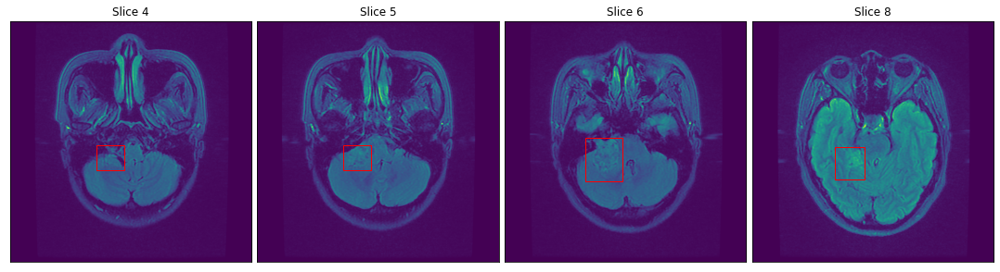

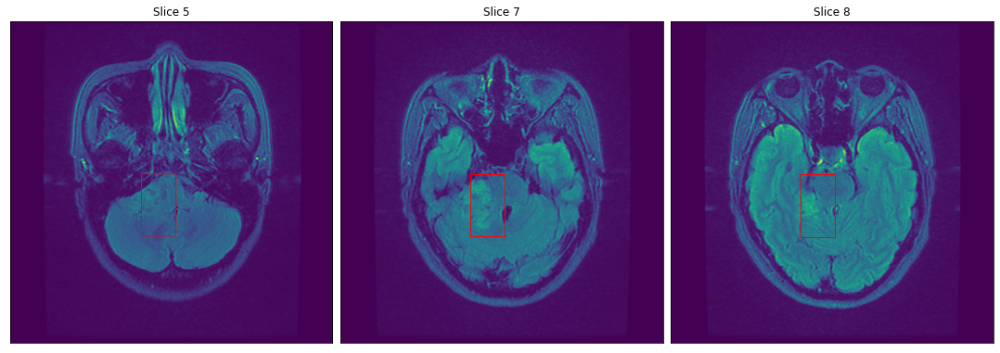

In [12]:
# match_group_slices

ROOT_PATH = '/home/single1/BACKUP/tintrung/brain-mri-tumor-dicom-masked'

for i in range(len(match_group_slices)):
    dcm_paths = [os.path.join(ROOT_PATH, match_group_slices[i][j][1], match_group_slices[i][j][2]) for j in range(len(match_group_slices[i]))]
    # print(dcm_paths)
    imgs = [read_dicom(dcm_path) for dcm_path in dcm_paths]
    anots = [match_group_slices[i][j][3] for j in range(len(match_group_slices[i]))]
    print(anots)
    print(len(anots))
    print(len(imgs))
    index_slice = [match_group_slices[i][j][4] for j in range(len(match_group_slices[i]))]
    plot_images(imgs, anots, index_slice)
    print('*'*19)

In [43]:
infile = open('/home/single3/Documents/tintrung/brainmri/tinnvt/fail_seriesUID.txt', 'r')
success_seriesUID = []
for line in infile:
    line = line.strip()
    success_seriesUID.append(line)
# success_seriesUID = set(success_seriesUID)
success_seriesUID

['1.2.840.113619.2.388.57473.14165493.12654.1599525247.529',
 '1.2.840.113619.2.5.1917161924716002237191600223719405000',
 '1.2.840.113619.2.388.57473.14165493.13307.1595840829.400',
 '1.2.840.113619.2.388.57473.14165493.30587.1579477610.178',
 '1.2.840.113619.2.388.57473.14165493.13531.1592546162.288',
 '1.2.840.113619.2.388.57473.14165493.13319.1599179758.700',
 '1.2.840.113619.2.410.15512023.5814788.18255.1580343453.490',
 '1.2.840.113619.2.388.57473.14165493.12954.1590103414.661',
 '1.2.840.113619.2.388.57473.14165493.12954.1590103414.200',
 '1.2.840.113619.2.388.57473.14165493.15658.1598402596.466',
 '1.2.840.113619.2.388.57473.14165493.12839.1602116980.648',
 '1.2.840.113619.2.388.57473.14165493.12600.1595978241.209',
 '1.2.840.113619.2.388.57473.14165493.12639.1596150914.572',
 '1.2.840.113619.2.388.57473.14165493.12574.1596755745.213',
 '1.2.840.113619.2.388.57473.14165493.18710.1591658390.771',
 '1.2.840.113619.2.388.57473.14165493.12404.1597274161.465',
 '1.2.840.113619.2.388

In [27]:
def min_distance(given_point: float, list_points: list):
        """
        Find a point of list point that has minimum distance with given point
        """
        list_distances = [np.abs(given_point - pt) for pt in list_points]
        index_min = np.argmin(list_distances)
        # print(list_distances)
        target_point = float(list_points[index_min])
        # print(target_point-given_point)
        return [index_min, target_point]

    
def covert_coordinate(listPoints3D, pointRoot3D, pixelSpacing):
    """
    Function convert real coordiantes points 3D into point 2D
    Input:
    @param: listPoints3D: List of list 4 points real world coordinates [[x0,y0,z0],[x1,y1,z1],[x2,y2,z2],[x3,y3,z3]]
    @param: pointRoot3D: point 3D ImagePositionPatient [x,y,z]
    @param: pixelSpacing
    Output:
    @param: plot_point: bounding boxes (x,y,w,h) for convenience to plot with function Rectangle and to object detection model later
    """
    # delta = np.sqrt(2*((pixelSpacing/2)**2))
    # pointRoot3D[0] = pointRoot3D[0] + delta
    # pointRoot3D[1] = pointRoot3D[1] + delta

    pt2D = []
    for pt in listPoints3D:
        new_pt = [(pt[0] - pointRoot3D[0])/pixelSpacing,
                  (pt[1] - pointRoot3D[1])/pixelSpacing]
        pt2D.append(new_pt)

    x = [p[0] for p in pt2D]
    y = [p[1] for p in pt2D]
    bottomleftx = min(x)
    bottomlefty = min(y)
    height = max(y) - min(y)
    width = max(x) - min(x)
    bbox = [bottomleftx, bottomlefty, width, height]
    return bbox


def plot_images(imgs, annotations, slice_index):
    """
    Plot annotation into a series of images
    Input:
    - imgs: array-like pixel of image
    - annotation: 2D array of bounding boxes for corresponding images where each element is (x,y,w,h) - (bottomleftx, bottemlefty, width, height)
    Output:
    - Matplotlib figure of brain mri with bbounding boxes
    """
    assert(len(imgs) == len(annotations))

    fig, axes = plt.subplots(1,len(imgs), figsize=(19, 19))

    for i in range(len(imgs)):
        rect = patches.Rectangle((annotations[i][0], annotations[i][1]), annotations[i][2], annotations[i][3], linewidth=1, edgecolor='r', facecolor='none')
        axes[i].add_patch(rect)
        axes[i].imshow(imgs[i])
        axes[i].title.set_text(f'Slice {slice_index[i]}')
        axes[i].xaxis.set_visible(False)
        axes[i].yaxis.set_visible(False)
        # axes[i].figure.set_size_inches(19, 19)
    plt.subplots_adjust(wspace=0.025, hspace=0.025)
    
    return fig


def read_dicom(path, voi_lut = True, fix_monochrome = True):
    dicom = pydicom.read_file(path)
    
    # VOI LUT (if available by DICOM device) is used to transform raw DICOM data to "human-friendly" view
    if voi_lut:
        data = apply_voi_lut(dicom.pixel_array, dicom)
    else:
        data = dicom.pixel_array
               
    # depending on this value, X-ray may look inverted - fix that:
    if fix_monochrome and dicom.PhotometricInterpretation == "MONOCHROME1":
        data = np.amax(data) - data
        
    data = data - np.min(data)
    data = data / np.max(data)
    data = (data * 255).astype(np.uint8)
        
    return data


def bboxes_MRI_seriesUID(choisen_seriesUID, df_dicom, df_xml, ROOT_PATH_DCM_MASKED):
    """
    Return all bounding boxes and slices that have anotated
    Input:
    - choisen_seriesUID:
    - df_dicom:
    - df_xml:
    - ROOT_PATH_DCM_MASKED:
    Output:
    - List of list index slices and bounding boxes brain tumor in these slices
    """
    # Filter all xml files have same seriesUID, sort values by "Slice Location"
    df_one_seriesUID = df_dicom[df_dicom['SeriesInstanceUID']==choisen_seriesUID].sort_values(by='SliceLocation')
    df_one_seriesUID = df_one_seriesUID.reset_index()
    # Find dicom files have same seriesUID
    df_get_point = df_xml[df_xml['seriesUid']==choisen_seriesUID]
    df_get_point = df_get_point.reset_index()
    points_one_seriesUID = df_get_point['point']
    label_one_seriesUID = df_get_point[df_get_point['type']=='global']['tags'].values
    # Maybe have more than one set of points, relative with more than one brain tumor 
    # Get axis-z in each set points (xml files)
    list_group_z_axis_sorted = []
    list_point3d = []
    dict_z_vs_point3d = {}

    for set_points in points_one_seriesUID:
        if not set_points==['None']:
            sublist_z = []
            sublist_point = [set_points[n:n+4] for n in range(0,len(set_points),4)]
            list_point3d.append(sublist_point)

            for count, point in enumerate(set_points):
                z = point[2]
                sublist_z.append(z)
            sublist_z = list(set(sublist_z))
            sublist_z_sorted = sorted(sublist_z)
            list_group_z_axis_sorted.append(sublist_z_sorted)

    # for i in range(len(list_point3d)):
    #     for j in range(len(list_point3d[i])):
    #         dict_z_vs_point3d[f'{list_point3d[i][j][0][2]}_{i}_{j}'] = list_point3d[i][j]

    for i, gr_z in enumerate(list_group_z_axis_sorted):
        for j, z_axis in enumerate(gr_z):
            dict_z_vs_point3d[f'{z_axis}_{i}_{j}'] = list_point3d[i][j]

    # Get coordinate-z of "Image Position Patient"
    z_meta_imgpose = [float(value[2])  for key,value in enumerate(df_one_seriesUID["ImagePositionPatient"])]
    pixelSpacing = float(df_one_seriesUID["PixelSpacing"][0][0])
    # z_meta_imgpose = sorted(z_meta_imgpose)

    # Get axis-z in each set points (xml files)
    match_group_slices = []
    for i, group_z_axis in enumerate(list_group_z_axis_sorted): 
        match_z = []
        for j, each_z in enumerate(group_z_axis):
            index_slice, z_coordinate = min_distance(each_z, z_meta_imgpose)
            # Truong hop 2 diem z deu nam gan 1 slice, quy uoc diem z thu hai se nam o slice tiep theo
            if (index_slice, z_coordinate) in match_z:
                seriesUID = df_one_seriesUID["SeriesInstanceUID"][index_slice+1]
                studiesUID = df_one_seriesUID["StudyInstanceUID"][index_slice+1]
                dcm_file = df_one_seriesUID["DicomFileName"][index_slice+1]
                linked_pt = dict_z_vs_point3d[f'{each_z}_{i}_{j}']
                
                bbox = covert_coordinate(linked_pt, df_one_seriesUID["ImagePositionPatient"][index_slice+1], pixelSpacing)
                match_z.append([seriesUID, studiesUID, dcm_file, bbox, index_slice+1])
            else:
                seriesUID = df_one_seriesUID["SeriesInstanceUID"][index_slice]
                studiesUID = df_one_seriesUID["StudyInstanceUID"][index_slice]
                dcm_file = df_one_seriesUID["DicomFileName"][index_slice]
                linked_pt = dict_z_vs_point3d[f'{each_z}_{i}_{j}']
                bbox = covert_coordinate(linked_pt, df_one_seriesUID["ImagePositionPatient"][index_slice], pixelSpacing)
                match_z.append([seriesUID, studiesUID, dcm_file, bbox, index_slice])
                # match_z: [index of slice in seriesUID dicom images, name of file dicom]
        match_group_slices.append(match_z)

    # Plot all slices in this seriesUID
    for i in range(len(match_group_slices)):
        dcm_paths = [os.path.join(ROOT_PATH_DCM_MASKED, match_group_slices[i][j][1], match_group_slices[i][j][2]) for j in range(len(match_group_slices[i]))]
        imgs = [read_dicom(dcm_path) for dcm_path in dcm_paths]
        anots = [match_group_slices[i][j][3] for j in range(len(match_group_slices[i]))]
        index_slice = [match_group_slices[i][j][4] for j in range(len(match_group_slices[i]))]
        plot_images(imgs, anots, index_slice)

    return match_group_slices

In [33]:
ROOT_PATH = '/home/single3/Documents/tintrung/brain-mri-tumor-dicom-masked'

df_dicom = pd.read_pickle('/home/single3/Documents/tintrung/brainmri/tinnvt/summary_dicom.pkl')
pd.set_option("display.max_colwidth", None)
df_dicom.head()

,StudyInstanceUID,SeriesInstanceUID,SeriesDescription,Rows,Columns,SliceThickness,PixelSpacing,SpacingBetweenSlices,SliceLocation,SmallestImagePixelValue,LargestImagePixelValue,WindowCenter,WindowWidth,ImagePositionPatient,ImageOrientationPatient,RepetitionTime,EchoTime,PatientPosition,DicomFileName
0,1.2.840.113619.6.388.101774739834280643528361334251926593124,1.2.840.113619.2.5.1916222523715996118091599611809219000,Apparent Diffusion Coefficient (mm2/s),256,256,5,"[1.0156, 1.0156]",6,12.219,269,5118,1300,2400,"[-129.19, -128.506, 19.0657]","[0.999995, 0.00266694, 0.0014183, -0.00258601, 0.998522, -0.0542916]",4384,101.9,HFS,1.2.840.113619.2.311.118469111826723530957815646435435346224.dcm
1,1.2.840.113619.6.388.101774739834280643528361334251926593124,1.2.840.113619.2.5.1916222523715996118091599611809219000,Apparent Diffusion Coefficient (mm2/s),256,256,5,"[1.0156, 1.0156]",6,-53.6836,48,5624,1300,2400,"[-129.086, -132.089, -46.8369]","[0.999995, 0.00266694, 0.0014183, -0.00258601, 0.998522, -0.0542916]",4384,101.9,HFS,1.2.840.113619.2.311.125282295065266504184867863002451722448.dcm
2,1.2.840.113619.6.388.101774739834280643528361334251926593124,1.2.840.113619.2.5.1916222523715996118091599611809219000,Apparent Diffusion Coefficient (mm2/s),256,256,5,"[1.0156, 1.0156]",6,30.1924,346,4091,1300,2400,"[-129.218, -127.529, 37.0391]","[0.999995, 0.00266694, 0.0014183, -0.00258601, 0.998522, -0.0542916]",4384,101.9,HFS,1.2.840.113619.2.311.13734497280751956864742956698508702383.dcm
3,1.2.840.113619.6.388.101774739834280643528361334251926593124,1.2.840.113619.2.5.1916222523715996118091599611809219000,Apparent Diffusion Coefficient (mm2/s),256,256,5,"[1.0156, 1.0156]",6,-29.719,205,4953,1300,2400,"[-129.124, -130.786, -22.8723]","[0.999995, 0.00266694, 0.0014183, -0.00258601, 0.998522, -0.0542916]",4384,101.9,HFS,1.2.840.113619.2.311.149759259314721767500053971461046076203.dcm
4,1.2.840.113619.6.388.101774739834280643528361334251926593124,1.2.840.113619.2.5.1916222523715996118091599611809219000,Apparent Diffusion Coefficient (mm2/s),256,256,5,"[1.0156, 1.0156]",6,0.23671,250,5017,1300,2400,"[-129.171, -129.158, 7.08339]","[0.999995, 0.00266694, 0.00141831, -0.00258601, 0.998522, -0.0542916]",4384,101.9,HFS,1.2.840.113619.2.311.162064945887768070496287289213718815545.dcm


In [34]:
df_xml = pd.read_pickle('/home/single3/Documents/tintrung/brainmri/tinnvt/summary_xml.pkl')
pd.set_option("display.max_colwidth", None)
df_xml.head()

,xml_name,patientPid,diagnosis,sessionId,type,annotation,scope,pointUnit,createTimestamp,imageUid,seriesUid,studyUid,tags,point
0,1.2.840.113619.6.388.101774739834280643528361334251926593124,YC21,"[908910, 908912]",BSDIEP,local,20,,mm,1610884981375,,1.2.840.113619.2.388.57473.14165493.12654.1599525247.526,1.2.840.113619.6.388.101774739834280643528361334251926593124,Mass/Nodule,"[[-12.035799980164, -70.509002685547, -40.168701171875], [4.9613599777222, -70.509002685547, -40.168701171875], [4.9613599777222, -52.882301330566, -40.168701171875], [-12.035799980164, -52.882301330566, -40.168701171875], [-36.587299346924, -83.728996276855, -18.568700790405], [7.4794502258301, -83.728996276855, -18.568700790405], [7.4794502258301, -47.216598510742, -18.568700790405], [-36.587299346924, -47.216598510742, -18.568700790405], [-25.885299682617, -81.210899353027, -4.1686601638794], [-0.074838802218437, -81.210899353027, -4.1686601638794], [-0.074838802218437, -58.548000335693, -4.1686601638794], [-25.885299682617, -58.548000335693, -4.1686601638794]]"
1,1.2.840.113619.6.388.101774739834280643528361334251926593124,YC21,"[908910, 908912]",BSDIEP,local,20,,mm,1610885017001,,1.2.840.113619.2.388.57473.14165493.12654.1599525247.526,1.2.840.113619.6.388.101774739834280643528361334251926593124,Cerebral edema,"[[-46.030101776123, -54.770900726318, -36.568698883057], [16.29280090332, -54.770900726318, -36.568698883057], [16.29280090332, -16.999399185181, -36.568698883057], [-46.030101776123, -16.999399185181, -36.568698883057], [-51.066299438477, -84.988098144531, -18.568700790405], [23.847099304199, -84.988098144531, -18.568700790405], [23.847099304199, 12.588199615479, -18.568700790405], [-51.066299438477, 12.588199615479, -18.568700790405], [-20.849100112915, -47.846099853516, 39.031299591064], [-2.5929400920868, -47.846099853516, 39.031299591064], [-2.5929400920868, -10.07470035553, 39.031299591064], [-20.849100112915, -10.07470035553, 39.031299591064]]"
2,1.2.840.113619.6.388.101774739834280643528361334251926593124,YC21,"[908910, 908912]",BSDIEP,local,20,,mm,1610885075681,,1.2.840.113619.2.388.57473.14165493.12654.1599525247.526,1.2.840.113619.6.388.101774739834280643528361334251926593124,Midline shift,"[[-0.074838802218437, -44.698501586914, -18.568700790405], [22.587999343872, -44.698501586914, -18.568700790405], [22.587999343872, 27.067300796509, -18.568700790405], [-0.074838802218437, 27.067300796509, -18.568700790405], [-0.074838802218437, -44.698501586914, -2.3686599731445], [35.17850112915, -44.698501586914, -2.3686599731445], [35.17850112915, 23.919700622559, -2.3686599731445], [-0.074838802218437, 23.919700622559, -2.3686599731445], [-0.074838802218437, -44.698501586914, 17.431299209595], [17.55179977417, -44.698501586914, 17.431299209595], [17.55179977417, 5.0339298248291, 17.431299209595], [-0.074838802218437, 5.0339298248291, 17.431299209595]]"
3,1.2.840.113619.6.388.101774739834280643528361334251926593124,YC21,"[908910, 908912]",BSDIEP,global,-1,series,,1610885136683,,1.2.840.113619.2.388.57473.14165493.12654.1599525247.529,1.2.840.113619.6.388.101774739834280643528361334251926593124,Meningioma,[None]
4,1.2.840.113619.6.388.106738880751051415278716030635969460033,23 BHK,"[841808, 841810]",BSDIEP,local,20,,mm,1607483610460,,1.2.840.113619.2.388.57473.14165493.13177.1591830725.678,1.2.840.113619.6.388.106738880751051415278716030635969460033,Mass/Nodule,"[[-1.3457000255585, -22.289400100708, -15.313799858093], [18.267099380493, -22.289400100708, -15.313799858093], [18.267099380493, -9.8679399490356, -15.313799858093], [-1.3457000255585, -9.8679399490356, -15.313799858093], [-1.3457000255585, -28.1732006073, -4.5137701034546], [20.228399276733, -28.1732006073, -4.5137701034546], [20.228399276733, -7.2528901100159, -4.5137701034546], [-1.3457000255585, -7.2528901100159, -4.5137701034546], [6.4994301795959, -23.596900939941, 9.88623046875], [18.267099380493, -23.596900939941, 9.88623046875], [18.267099380493, -9.8679399490356, 9.8862304

In [39]:
slices = bboxes_MRI_seriesUID(choisen_seriesUID='1.2.840.113619.2.388.57473.14165493.12654.1599525247.529', 
                                    df_dicom=df_dicom, 
                                    df_xml=df_xml, 
                                    ROOT_PATH_DCM_MASKED=ROOT_PATH)


1.2.840.113619.2.388.57473.14165493.13319.1599179758.700
0
*******************************************************************************************************************************************************************************************************
1.2.840.113619.2.388.57473.14165493.12954.1590103414.200
list index out of range
*******************************************************************************************************************************************************************************************************
1.2.840.113619.2.388.57473.14165493.15658.1598402596.466
0
*******************************************************************************************************************************************************************************************************
1.2.840.113619.2.388.57473.14165493.12574.1596755745.213
0
**********************************************************************************************************************************************

<ipython-input-27-87308c2f984f>:54: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(1,len(imgs), figsize=(19, 19))


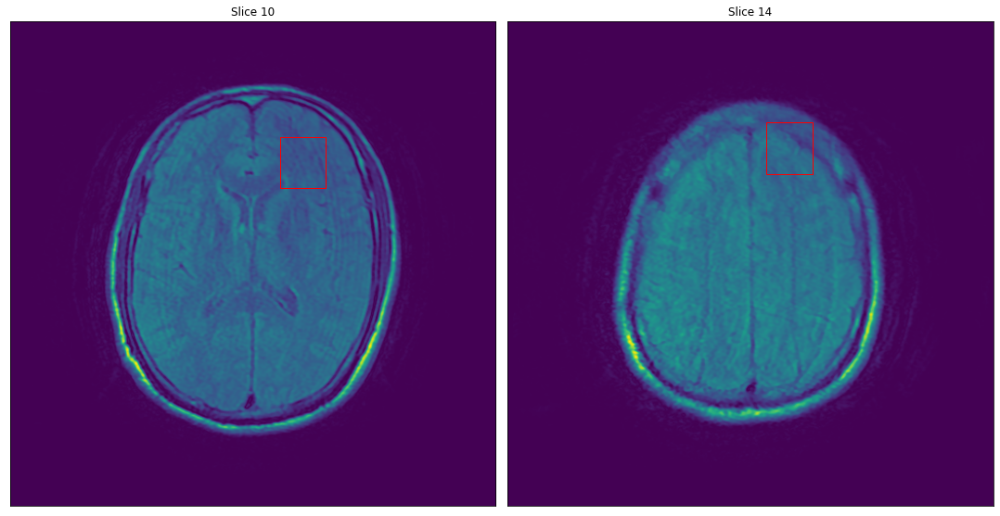

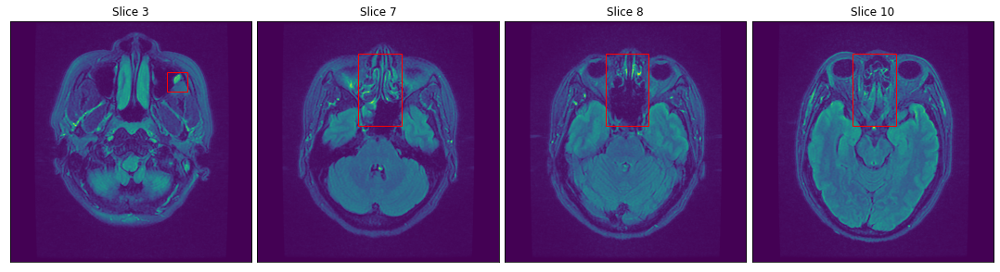

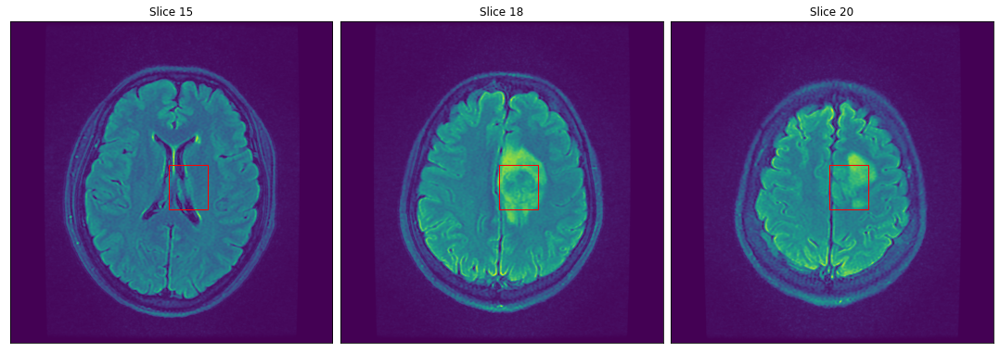

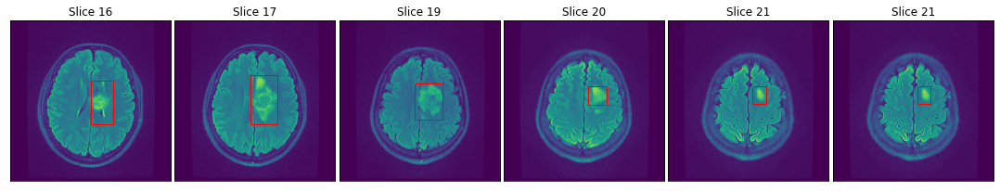

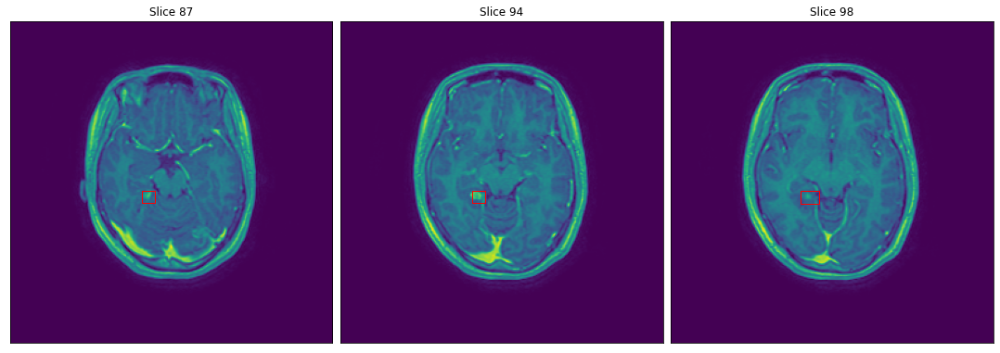

...

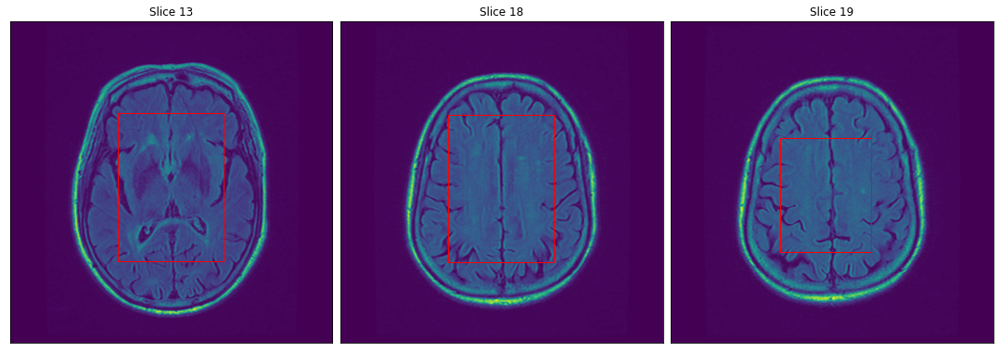

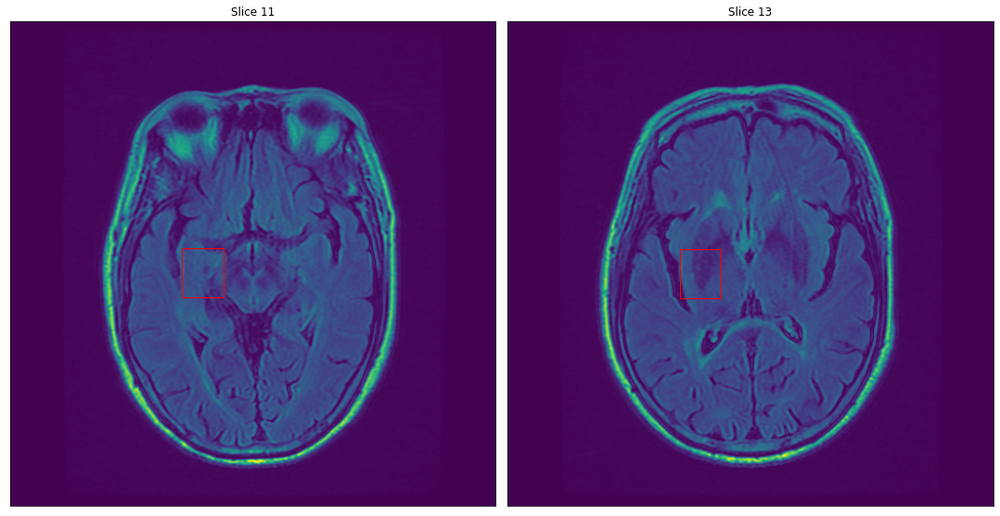

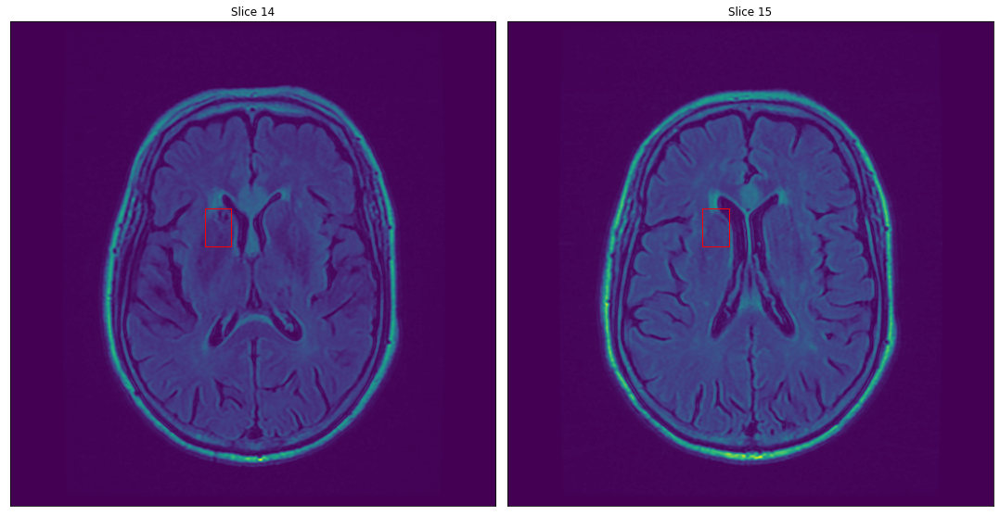

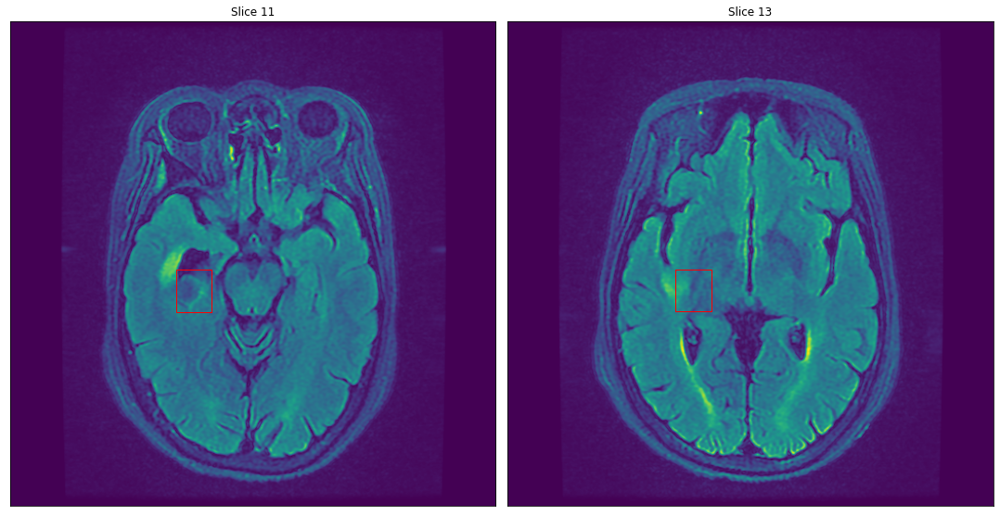

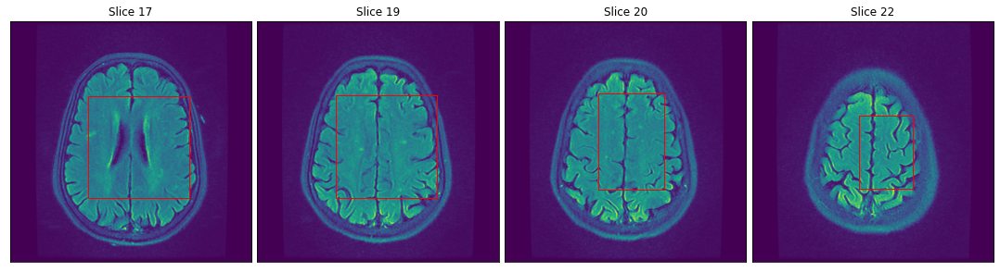

In [45]:
ROOT_PATH = '/home/single3/Documents/tintrung/brain-mri-tumor-dicom-masked'

for name_series in success_seriesUID:   
    try: 
        slices = bboxes_MRI_seriesUID(choisen_seriesUID=name_series, 
                                    df_dicom=df_dicom, 
                                    df_xml=df_xml, 
                                    ROOT_PATH_DCM_MASKED=ROOT_PATH)
    except Exception as error:
        print(name_series)
        print(error)
        print('*'*199)

In [ ]:
def display_images(imgs, bboxes, labelNames, slice_index):
    """
    Plot annotation into a series of images
    Input:
    - imgs: array-like pixel of image
    - bboxes: 2D array of bounding boxes for corresponding images where each element is (x,y,w,h) - (bottomleftx, bottemlefty, width, height)
    Output:
    - Matplotlib figure of brain mri with bbounding boxes
    """
    assert(len(imgs) == len(bboxes))

    fig, axes = plt.subplots(1,len(imgs), figsize=(19, 19))

    for i in range(len(imgs)):
        rect = patches.Rectangle((bboxes[i][0], bboxes[i][1]), bboxes[i][2], bboxes[i][3], linewidth=1, edgecolor='r', facecolor='none')
        axes[i].add_patch(rect)
        axes[i].text(bboxes[i][0], bboxes[i][1], labelNames[i], fontsize=12, color='white')
        axes[i].imshow(imgs[i])
        axes[i].title.set_text(f'Slice {slice_index[i]}')
        axes[i].xaxis.set_visible(False)
        axes[i].yaxis.set_visible(False)
        axes[i].figure.set_size_inches(19, 19)

    plt.subplots_adjust(wspace=0.025, hspace=0.025)
    
    return fig

In [54]:
dataset = pd.read_pickle('/home/single3/Documents/tintrung/brainmri/tinnvt/dataset.pkl')
cols = dataset.columns
cols

Index(['SliceIndex', 'Bbox', 'Tag', 'LesionIndex', 'DicomFileName',
       'SeriesInstanceUID_x', 'StudyInstanceUID_x', 'SeriesNumberInstances',
       'SeriesPlane', 'SeriesLabelMerge', 'StudyInstanceUID_y',
       'SeriesInstanceUID_y', 'SeriesDescription', 'Rows', 'Columns',
       'SliceThickness', 'PixelSpacing', 'SpacingBetweenSlices',
       'SliceLocation', 'SmallestImagePixelValue', 'LargestImagePixelValue',
       'WindowCenter', 'WindowWidth', 'ImagePositionPatient',
       'ImageOrientationPatient', 'RepetitionTime', 'EchoTime',
       'PatientPosition'],
      dtype='object')

In [55]:
dataset

,SliceIndex,Bbox,Tag,LesionIndex,DicomFileName,SeriesInstanceUID_x,StudyInstanceUID_x,SeriesNumberInstances,SeriesPlane,SeriesLabelMerge,...,SliceLocation,SmallestImagePixelValue,LargestImagePixelValue,WindowCenter,WindowWidth,ImagePositionPatient,ImageOrientationPatient,RepetitionTime,EchoTime,PatientPosition
0,3,"[154.39346367564397, 156.2300149527727, 63.81449149132925, 73.46089487706749]",Cerebral edema,1,1.2.840.113619.2.388.57473.14165493.11868.1594941404.759.dcm,1.2.840.113619.2.388.57473.14165493.12597.1594941312.645,1.2.840.113619.6.388.299644115384907986947717284768417434914,20,axial,flair,...,15.75,0,2015,1007,2015,"[-129.097, -115.949, 15.5563]","[0.999989, 0.00467001, 0.000909002, -0.0046706, 0.999989, 0.000583762]",8155,77.064,HFS
1,4,"[156.63331754848957, 178.49881788556516, 46.00571478009451, 42.29562871331274]",Mass_Nodule,0,1.2.840.113619.2.388.57473.14165493.11868.1594941404.760.dcm,1.2.840.113619.2.388.57473.14165493.12597.1594941312.645,1.2.840.113619.6.388.299644115384907986947717284768417434914,20,axial,flair,...,22.75,0,2102,1051,2102,"[-129.104, -115.953, 22.5563]","[0.999989, 0.00467001, 0.000908998, -0.0046706, 0.999989, 0.000583766]",8155,77.064,HFS
2,4,"[148.79579153229275, 153.6374763449819, 77.36409332267735, 97.54907814533797]",Cerebral edema,1,1.2.840.113619.2.388.57473.14165493.11868.1594941404.760.dcm,1.2.840.113619.2.388.57473.14165493.12597.1594941312.645,1.2.840.113619.6.388.299644115384907986947717284768417434914,20,axial,flair,...,22.75,0,2102,1051,2102,"[-129.104, -115.953, 22.5563]","[0.999989, 0.00467001, 0.000908998, -0.0046706, 0.999989, 0.000583766]",8155,77.064,HFS
3,5,"[151.63636935938857, 179.06321879095267, 56.57976676715177, 59.54796005758689]",Mass_Nodule,0,1.2.840.113619.2.388.57473.14165493.11868.1594941404.761.dcm,1.2.840.113619.2.388.57473.14165493.12597.1594941312.645,1.2.840.113619.6.388.299644115384907986947717284768417434914,20,axial,flair,...,29.75,0,2015,1007,2015,"[-129.11, -115.957, 29.5563]","[0.999989, 0.00467001, 0.000908998, -0.0046706, 0.999989, 0.000583766]",8155,77.064,HFS
4,5,"[144.0751101398004, 151.45225823234563, 88.79133045882301, 117.86416827209172]",Cerebral edema,1,1.2.840.113619.2.388.57473.14165493.11868.1594941404.761.dcm,1.2.840.113619.2.388.57473.14165493.12597.1594941312.645,1.2.840.113619.6.388.299644115384907986947717284768417434914,20,axial,flair,...,29.75,0,2015,1007,2015,"[-129.11, -115.957, 29.5563]","[0.999989, 0.00467001, 0.000908998, -0.0046706, 0.999989, 0.000583766]",8155,77.064,HFS
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4018,19,"[121.01643489600188, 199.82456088968692, 123.07129314974468, 90.93663391925102]",Arteriovenous malformation,1,1.2.840.113619.2.410.15512023.5814788.12697.1596413176.132.dcm,1.2.840.113619.2.410.15512023.5814788.13131.1596413079.131,1.2.840.113619.6.410.67189537291259173420834055643483688197,25,axial,flair,...,0.156564,0,1848,924,1848,"[-113.202, -94.2187, 6.70161]","[0.999498, -0.0286164, -0.013587, 0.0280019, 0.998664, -0.0434378]",7000,140.8,HFS
4019,20,"[121.46104175706812, 200.35995082141872, 127.6288959774083, 90.52762630680033]",Arteriovenous malformation,1,1.2.840.113619.2.410.15512023.5814788.12697.1596413176.120.dcm,1.2.840.113619.2.410.15512023.5814788.13131.1596413079.131,1.2.840.113619.6.410.67189537291259173420834055643483688197,25,axial,flair,...,6.15035,0,2071,1035,2071,"[-113.113, -93.9605, 12.6954]","[0.999498, -0.0286164, -0.013587, 0.028002, 0.998664, -0.0434378]",7000,140.8,HFS
4020,21,"[145.73177631709083, 207.09768705605745, 100.34752295568799, 82.371301570377]",Arteriovenous malformation,1,1.2.840.113619.2.410.15512023.5814788.12697.1596413176.133.dcm,1.2.840.113619.2.410.15512023.5814788.13131.1596413079.131,1.2.840.113619.6.410.67189537291259173420834055643483688197,25,axial,flair,...,12.1441,0,1829,914,1829,"[-113.024, -93.7023, 18.6892]","[0.999498, -0.0286164, -0.013587, 0.028002, 0.998664, -0.0434378]",7000,140.8,HFS
4021,22,"[162

In [61]:
dataset.shape[0]

4023

In [83]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2
from tqdm import tqdm


pathSrcImages = '/home/single3/Documents/tintrung/yolov5_2classes/images'
pathSavedImages = '/home/single3/Documents/tintrung/yolov5_2classes/images_with_labels'

list_DCMs = list(dataset['DicomFileName'].drop_duplicates())

for idx in tqdm(range(len(list_DCMs))):
    
    try:
        nameDCM = list_DCMs[idx]
        df_dcm = dataset[dataset['DicomFileName']==nameDCM].reset_index()
        namePNG = nameDCM.replace('.dcm', '.png')
        pathPNG = os.path.join(pathSrcImages, namePNG)
        img = cv2.imread(pathPNG)
        for i, labelName in enumerate(list(df_dcm['Tag'])):
            if labelName=='Mass_Nodule':
                img = cv2.rectangle(img, (int(df_dcm['Bbox'][i][0]), int(df_dcm['Bbox'][i][1])), (int(df_dcm['Bbox'][i][0]+df_dcm['Bbox'][i][2]), int(df_dcm['Bbox'][i][1]+df_dcm['Bbox'][i][3])), (255, 0, 0), thickness=3, lineType=cv2.LINE_AA)
                img = cv2.putText(img, labelName, (int(df_dcm['Bbox'][i][0]), int(df_dcm['Bbox'][i][1]-3)), cv2.FONT_HERSHEY_SIMPLEX, 1, [225, 0, 0], thickness=2, lineType=cv2.LINE_AA)
            elif labelName=='Cerebral edema':
                img = cv2.rectangle(img, (int(df_dcm['Bbox'][i][0]), int(df_dcm['Bbox'][i][1])), (int(df_dcm['Bbox'][i][0]+df_dcm['Bbox'][i][2]), int(df_dcm['Bbox'][i][1]+df_dcm['Bbox'][i][3])), (125, 0, 255), thickness=3, lineType=cv2.LINE_AA)
                img = cv2.putText(img, labelName, (int(df_dcm['Bbox'][i][0]), int(df_dcm['Bbox'][i][1]-3)), cv2.FONT_HERSHEY_SIMPLEX, 1, [125, 0, 255], thickness=2, lineType=cv2.LINE_AA)
        cv2.imwrite(os.path.join(pathSavedImages, namePNG), img)
    except Exception as error:
        print(f'File {nameDCM} has error {error}')

100%|██████████| 2482/2482 [00:27<00:00, 91.63it/s] 
